In [46]:
#EDA packages
import pandas as pd
import numpy as np
import random
#Machine learning packages
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

In [47]:
#pswd_data = pd.read_csv("passwordsdata.csv",error_bad_lines=False)
pswd_data = pd.read_csv("/content/cleanpasswordlist.csv")

In [5]:
pswd_data.head()

,password,strength
0,123456,weak
1,password,weak
2,letmein,weak
3,qwerty,weak
4,welcome,weak


In [48]:
pswd = np.array(pswd_data)
print(pswd)

[['Letmein*175Sunshine' 'strong']
 ['Computer*814Michael' 'strong']
 ['Qwerty$202Michael' 'strong']
 ...
 ['Welcome#770Summer' 'strong']
 ['Winter!705Winter' 'strong']
 ['Summer%556Football' 'strong']]


In [49]:
# Shuffle data
random.shuffle(pswd)

In [50]:
# Grouping our data into features and labels
# y = labels
ylabels  = [s[1] for s in pswd]
allpasswords = [s[0] for s in pswd]
print(allpasswords)

['Letmein*175Sunshine', 'Computer*814Michael', 'Computer*814Michael', 'Computer*814Michael', 'Computer*814Michael', 'Monkey&924Letmein', 'Monkey&924Letmein', 'Donald%076Welcome', 'Charlie$188Summer', 'Qwerty$202Michael', 'Master@451Charlie', 'Letmein*175Sunshine', 'Summer&021Michael', 'Iloveyou$263Sunshine', 'Computer*814Michael', 'Qwerty$202Michael', 'Master@451Charlie', 'Dragon%365Hunter', 'Welcome#741Donald', 'Iloveyou!517Dragon', 'Flower&678Football', 'Computer$346Football', 'Princess@929Master', 'Welcome#741Donald', 'Donald%076Welcome', 'Letmein*175Sunshine', 'Iloveyou!517Dragon', 'Michael*018Princess', 'Donald&563Princess', 'Flower&678Football', 'Iloveyou$170Monkey', 'Purple!620Internet', 'Summer%798Qwerty', 'Charlie$188Summer', 'Flower&678Football', 'Charlie%140Computer', 'Internet!660Purple', 'Donald%653Sunshine', 'Sunshine$289Welcome', 'Qwerty$202Michael', 'Summer%798Qwerty', 'Charlie%140Computer', 'Donald&563Princess', 'Purple@500Purple', 'Iloveyou!517Dragon', 'Hunter@285Prin

In [51]:
ylabels
len(ylabels)

669425

In [52]:
len(allpasswords)

669425

In [53]:
def makeTokens(f):
    tokens = []
    for i in f:
        tokens.append(i)
    return tokens


In [54]:
# Using Default Tokenizer
#vectorizer = TfidfVectorizer()

# Using Custom Tokenizer
vectorizer = TfidfVectorizer(tokenizer=makeTokens)

In [55]:
# Store vectors into X variable as Our X allpasswords
X = vectorizer.fit_transform(allpasswords)

/usr/local/lib/python3.11/dist-packages/sklearn/feature_extraction/text.py:517: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn(


In [56]:
X_train, X_test, y_train, y_test = train_test_split(X, ylabels, test_size=0.2, random_state=42)

In [57]:
# Model Building
#using logistic regression
# Multi_class for fast algorithm
logit = LogisticRegression(penalty='l2',multi_class='ovr')
logit.fit(X_train, y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


LogisticRegression(multi_class='ovr')

In [58]:
print("Accuracy :",logit.score(X_test, y_test))

Accuracy : 0.9999626545169362


In [59]:
X_predict = ['password',
             'pYthon'
             'faizanahmad',
             'password##',
             'ajd1348#28t**',
             'ffffffffff',
             'kuiqwasdi',
             '123456',
             'abcdef']

X_predict = vectorizer.transform(X_predict)
y_Predict = logit.predict(X_predict)
print(y_Predict)

['medium' 'medium' 'strong' 'strong' 'strong' 'medium' 'strong' 'medium']


In [60]:
# http://www.passwordmeter.com/
# https://password.kaspersky.com/

New_predict = [
    "1qaz2wsx",
    "306187mn",
    "rados1#@1$#@$@$#@$",
    "newyork911",
    "abc123",
    "taqiyudin100587",
    "wjr5443",
    "nana0428"
]

New_predict = vectorizer.transform(New_predict)
New_y_Predict = logit.predict(New_predict)
print(New_y_Predict)


['strong' 'strong' 'strong' 'strong' 'strong' 'strong' 'strong' 'strong']


In [61]:
# Using Default Tokenizer
vectorizer = TfidfVectorizer()
# Store vectors into X variable as Our X allpasswords
X1 = vectorizer.fit_transform(allpasswords)

In [62]:
X_train, X_test, y_train, y_test = train_test_split(X1, ylabels, test_size=0.2, random_state=42)

In [63]:
# Model Building
#using logistic regression
# Multi_class for fast algorithm
logit = LogisticRegression(penalty='l2',multi_class='ovr')
logit.fit(X_train, y_train)

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


LogisticRegression(multi_class='ovr')

In [64]:
print("Accuracy :",logit.score(X_test, y_test))

Accuracy : 0.9999626545169362


In [65]:
X_predict1 = ['password',
             'pYthonqwas'
             'faizanahmad',
             'password##',
             'ajd1348#28t**',
             'ffffffffff',
             'kuiqwasdi',
             '123456',
             'abcdef']

X_predict1 = vectorizer.transform(X_predict1)
y_Predict1 = logit.predict(X_predict1)
print(y_Predict1)

['medium' 'medium' 'medium' 'medium' 'medium' 'medium' 'medium' 'medium']


In [66]:
New_predict2 = ["1qaz2wsx",
"306187mn",
"rados1",
"newyork911",
"abc123",
"taqiyudin100587",
"wjr5443",
"nana0428"]

New_predict2 = vectorizer.transform(New_predict2)
y_Predict2 = logit.predict(New_predict2)
print(y_Predict2)

['medium' 'medium' 'medium' 'medium' 'medium' 'medium' 'medium' 'medium']


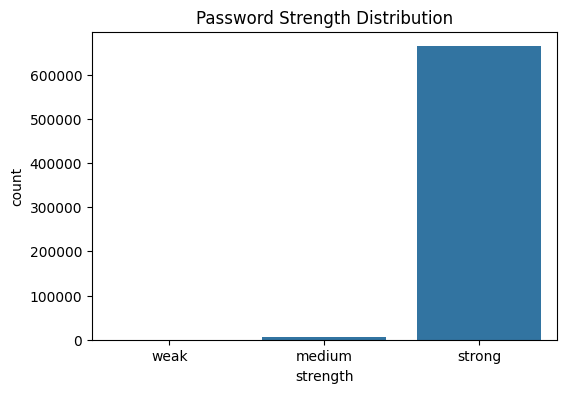

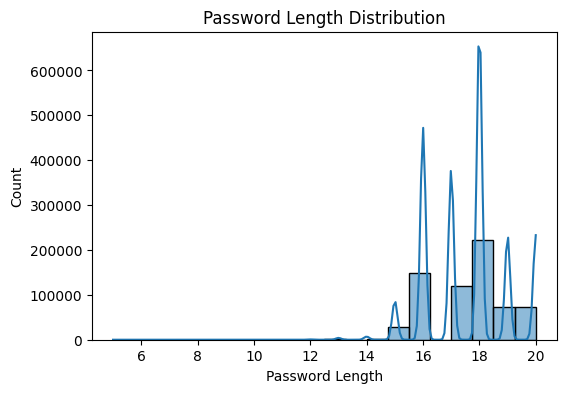

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

# Class distribution
plt.figure(figsize=(6,4))
sns.countplot(x='strength', data=pswd_data, order=['weak', 'medium', 'strong'])
plt.title("Password Strength Distribution")
plt.show()

# Password length distribution
pswd_data['length'] = pswd_data['password'].apply(len)
plt.figure(figsize=(6,4))
sns.histplot(pswd_data['length'], bins=20, kde=True)
plt.title("Password Length Distribution")
plt.xlabel("Password Length")
plt.show()


In [70]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

# Logistic Regression
logit.fit(X_train, y_train)
logit_pred = logit.predict(X_test)
print("Logistic Regression Accuracy:", accuracy_score(y_test, logit_pred))

# Naive Bayes
nb = MultinomialNB()
nb.fit(X_train, y_train)
nb_pred = nb.predict(X_test)
print("Naive Bayes Accuracy:", accuracy_score(y_test, nb_pred))

/usr/local/lib/python3.11/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Logistic Regression Accuracy: 0.9999626545169362
Naive Bayes Accuracy: 0.9919931284311163
